In [1]:
import importlib
import time
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy import integrate
from scipy import interpolate
import os
import pickle

In [2]:
from multi_loc import covariance, assimilate, utilities

In [3]:
%matplotlib inline

In [4]:
def imshow(X, title=None, vmin=None, vmax=None, cmap=None):
    plt.figure()
    im = plt.imshow(X, vmin=vmin, vmax=vmax, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)

In [5]:
load_files = True

In [6]:
home = os.path.expanduser('~')
dir_name = f'{home}/Documents/python_code/multi_loc/notebooks/first_cycle_run/'

if not load_files:
    N_Z = 960
    K = 32
    I = 12
    F = float(15)
    b = float(10)
    c = float(2.5)
    alpha = (3 * I**2 + 3) / (2 * I**3 + 4 * I)
    beta = (2 * I**2 + 1) / (I**4 + 2 * I**2)
    LM3_params = {'K': K,
                  'I': I,
                  'F': F,
                  'b': b,
                  'c': c,
                  'alpha': alpha,
                  'beta': beta}

    coarse = 8
    N_eZ = 10
    N_eX = 200

    dt = 0.01
    dt_obs = 0.1

    T_ens = 1000
    T_ic = 100
    T_KF = 30
    # random obs
    
    N_obs = int(N_Z/8)
    Z_obs_loc = np.random.choice(N_Z, N_obs)
    Z_obs_loc.sort()

    R_Z_sd = 0.5
    R_Xc_sd = 1

    KF_params = {'coarse': coarse,
                 'N_Z': N_Z,
                 'N_eZ': N_eZ,
                 'N_eX': N_eX,
                 'N_obs': N_obs,
                 'dt': dt,
                 'dt_obs': dt_obs,
                 'T_ens': T_ens,
                 'T_ic': T_ic,
                 'T_KF': T_KF,
                 'Z_obs_loc': Z_obs_loc,
                 'R_Z_sd': R_Z_sd,
                 'R_Xc_sd': R_Xc_sd}

    if not os.path.exists(dir_name):
        os.mkdir(dir_name)
    
    this_path = os.path.join(dir_name, 'LM3_params.pkl')
    with open(this_path, mode='wb') as f:
        pickle.dump(LM3_params, f)

    this_path = os.path.join(dir_name, 'KF_params.pkl')
    with open(this_path, mode='wb') as f:
        pickle.dump(KF_params, f)
else:
    this_path = os.path.join(dir_name, 'LM3_params.pkl')
    with open(this_path, mode='rb') as f:
        LM3_params = pickle.load(f)
    for key, val in LM3_params.items():
        exec(key + '=val')

    this_path = os.path.join(dir_name, 'KF_params.pkl')
    with open(this_path, mode='rb') as f:
        KF_params = pickle.load(f)
    for key, val in KF_params.items():
        exec(key + '=val') 
        
N_Xc = N_Z//coarse
K_c = K//coarse
x_Z = np.arange(N_Z)
x_Xc = x_Z[::coarse] 
N_t_KF = int(T_KF/dt + 1)
t_kf = np.round(np.linspace(0, T_KF, N_t_KF), 2)
R_Z = R_Z_sd**2 * np.eye(N_obs)
H_Z = np.eye(N_Z)[Z_obs_loc]
R_Xc = (R_Xc_sd**2) * np.eye(N_Xc)
H_Xc = np.eye(N_Xc)
H_f2c = np.eye(N_Z)[::coarse]
X_obs_loc = np.arange(N_Z)[::coarse]

# Long run to generate ensemble

In [7]:
this_path = os.path.join(dir_name, 'Z_long_run.npy')

if not load_files:
    X_interp = np.random.uniform(low=-5, high=10, size=N_Z//K)
    X_interp = np.concatenate([X_interp, [X_interp[0]]])
    x = np.arange(N_Z)
    x_interp = x[::K]
    x_interp = np.concatenate([x_interp, [x[-1] + 1]])
    f_X = interpolate.interp1d(x_interp, X_interp, kind='quadratic')
    X0 = f_X(x)
    Y0 = np.random.uniform(low=-0.5, high=1, size=N_Z)
    Z0 = X0 + X0*Y0/X0.max()
    N_t_ic = int(T_ic/dt + 1)
    t = np.linspace(0, T_ic, N_t_ic)
    Z = utilities.return_LM3_data(Z0, t, **LM3_params)
    Z0 = Z[:, -1]

    N_t_ens = int(T_ens/dt + 1)
    t = np.linspace(0, T_ens, N_t_ens)
    Z = utilities.return_LM3_data(Z0, t, **LM3_params)

    np.save(this_path, Z)
else:
    Z = np.load(this_path)

# Generate ensemble from long run

In [8]:
if not load_files:
    X0_ens, Z0_ens = utilities.generate_X_Z_LM3_ens(
        Z, N_eX, N_eZ, coarse, I, alpha, beta)
    
    this_path = os.path.join(dir_name, 'X0_ens.npy')
    np.save(this_path, X0_ens)
    this_path = os.path.join(dir_name, 'Z0_ens.npy')
    np.save(this_path, Z0_ens)
else:
    this_path = os.path.join(dir_name, 'X0_ens.npy')
    X0_ens = np.load(this_path)
    this_path = os.path.join(dir_name, 'Z0_ens.npy')
    Z0_ens = np.load(this_path)

# Set up ground truth and time series

In [9]:
this_path = os.path.join(dir_name, 'Z_GT.npy')

if not load_files:
    X_interp = np.random.uniform(low=-5, high=10, size=N_Z//K)
    X_interp = np.concatenate([X_interp, [X_interp[0]]])
    x = np.arange(N_Z)
    x_interp = x[::K]
    x_interp = np.concatenate([x_interp, [x[-1] + 1]])
    f_X = interpolate.interp1d(x_interp, X_interp, kind='quadratic')
    X0 = f_X(x)
    Y0 = np.random.uniform(low=-0.5, high=1, size=N_Z)
    Z0 = X0 + X0*Y0/X0.max()
    N_t_ic = int(T_ic/dt + 1)
    t = np.linspace(0, T_ic, N_t_ic)
    Z = utilities.return_LM3_data(Z0, t, **LM3_params)
    Z0 = Z[:, -1]
    Z_GT = utilities.return_LM3_data(Z0, t_kf, **LM3_params)
    np.save(this_path, Z_GT)
else:
    Z_GT = np.load(this_path)

In [10]:
X_GT = utilities.window_sum_Z(Z_GT, I=I, alpha=alpha, beta=beta)
Y_GT = Z_GT - X_GT

In [11]:
Zloc = np.arange(N_Z)

Z_ts = xr.DataArray(Z_GT,
                    dims=('loc', 'time'),
                    coords={'loc': Zloc,
                            'time': t_kf})
X_ts = xr.DataArray(X_GT,
                    dims=('loc', 'time'),
                    coords={'loc': Zloc,
                            'time': t_kf})
Y_ts = xr.DataArray(Y_GT,
                    dims=('loc', 'time'),
                    coords={'loc': Zloc,
                            'time': t_kf})

X0_ens_temp = utilities.window_sum_Z(Z0_ens, I=I, alpha=alpha, beta=beta)
Y0_ens = Z0_ens - X0_ens_temp

# Generate observations and related matices

In [12]:
every_t = int(dt_obs/dt)
t_obs = t_kf[::every_t]

Z_obs_ts = H_Z @ Z_ts.sel(time=t_obs).values
X_obs_ts = H_f2c @ X_ts.sel(time=t_obs).values

In [18]:
if not load_files:
    this_path = os.path.join(dir_name, 'Z_obs_ts.npy')
    Z_obs_ts = Z_obs_ts + np.random.multivariate_normal(np.zeros(N_obs), R_Z, t_obs.size).T
    np.save(this_path, Z_obs_ts)
    
    this_path = os.path.join(dir_name, 'X_obs_ts.npy')
    X_obs_ts = X_obs_ts + np.random.multivariate_normal(np.zeros(N_Xc), R_Xc, t_obs.size).T
    np.save(this_path, X_obs_ts)
else:
    this_path = os.path.join(dir_name, 'Z_obs_ts.npy')
    Z_obs_ts = np.load(this_path)
    
    this_path = os.path.join(dir_name, 'X_obs_ts.npy')
    X_obs_ts = np.load(this_path)
    
Z_obs_ts = xr.DataArray(Z_obs_ts,
                        dims=('loc', 'time'),
                        coords={'loc': Z_obs_loc,
                                'time': t_obs})
X_obs_ts = xr.DataArray(X_obs_ts,
                        dims=('loc', 'time'),
                        coords={'loc': X_obs_loc,
                                'time': t_obs})

In [20]:
%matplotlib inline

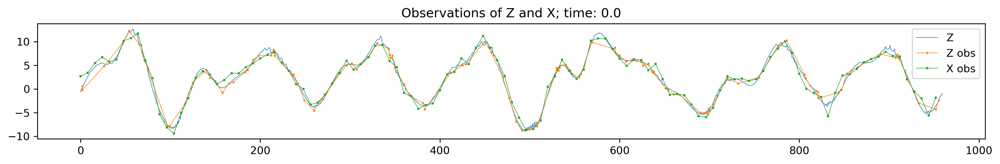

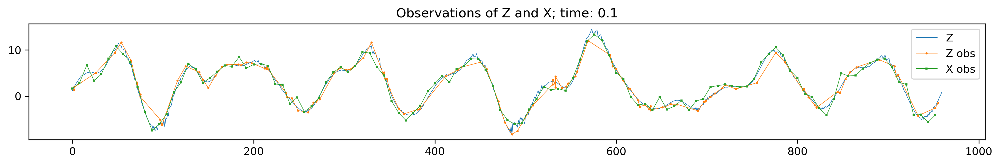

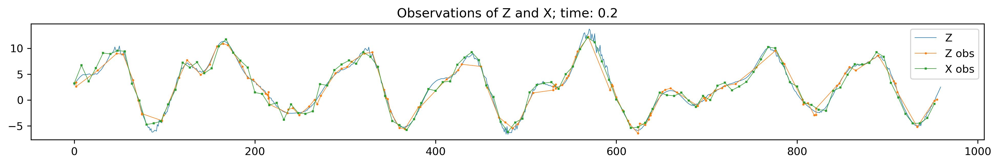

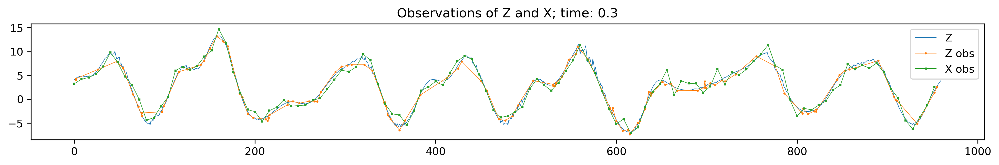

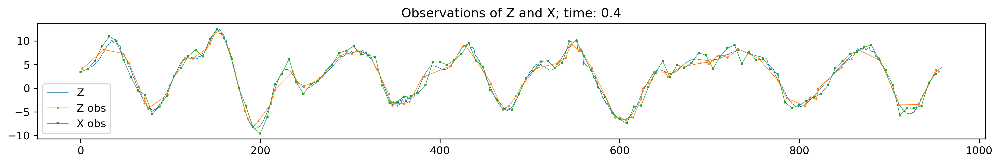

...

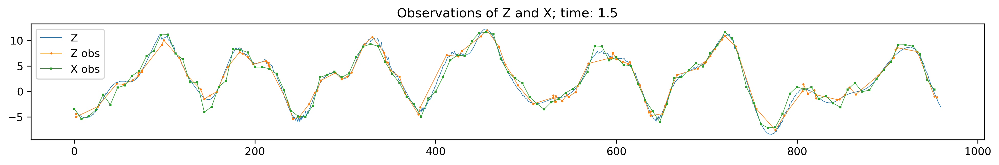

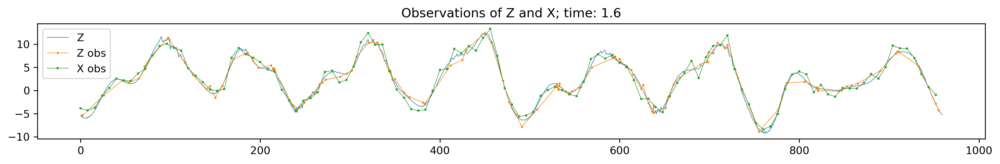

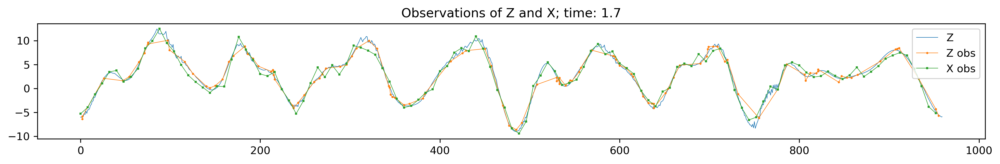

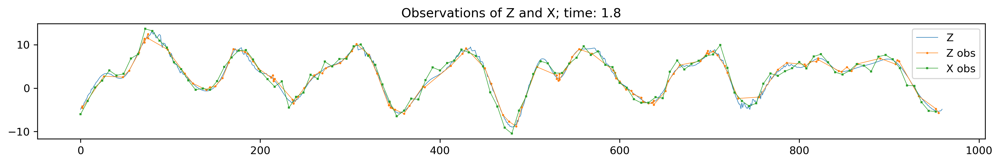

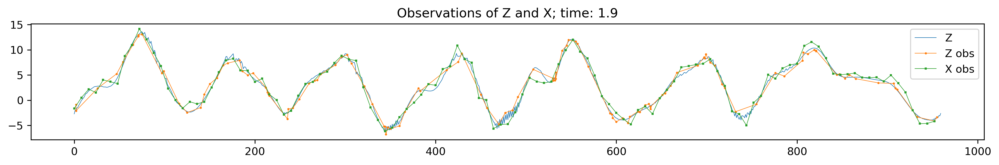

In [19]:
for at in Z_obs_ts.time.values[:20]:    
    figsize = plt.figaspect(1/8)
    plt.figure(dpi=300, figsize=figsize)
    plt.plot(Z_ts.sel(time=at), linewidth=0.5)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=at), '-o', markersize=1, linewidth=0.5)
    plt.plot(X_obs_loc, X_obs_ts.sel(time=at), '-s', markersize=1, linewidth=0.5)
    plt.legend(['Z', 'Z obs', 'X obs'])
    plt.title(f'Observations of Z and X; time: {at}')

# Cycle

# Cycle with standard localization

In [61]:
atitle='standard loc'

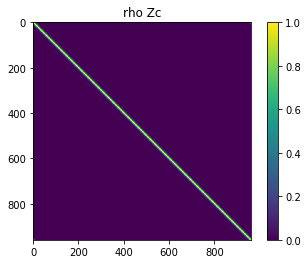

In [81]:
# rho0_Zf = 5
# rho_Zf = np.arange(N_Z)
# rho_Zf = np.minimum(np.abs(N_Z - rho_Zf)%N_Z, rho_Zf)
# rho_Zf = np.exp(-(rho_Zf**2)/(2*rho0_Zf**2))
# rho_Zf = sp.linalg.circulant(rho_Zf)
# imshow(rho_Zf, 'rho Zf',
#        vmin=0, vmax=1)
# imshow(rho_Zf[:20, :20], 'rho Zf zoom',
#        vmin=0, vmax=1)

rho0_Zc = 5
rho_Zc = np.arange(N_Z)
rho_Zc = np.minimum(np.abs(N_Z - rho_Zc)%N_Z, rho_Zc)
rho_Zc = np.exp(-(rho_Zc**2)/(2*rho0_Zc**2))
rho_Zc = sp.linalg.circulant(rho_Zc)
imshow(rho_Zc, 'rho Zc',
       vmin=0, vmax=1)

cycle_dict = {'Z0_ens': Z0_ens,
              'Z_obs_ts': Z_obs_ts,
              'R_Z': R_Z, 'H_Z': H_Z,
              'dt': dt,
              'rho_Z': rho_Zc,}

In [82]:
importlib.reload(assimilate)
importlib.reload(utilities)

Z_ens_ts = assimilate.cycle_KF_LM3_stdrd(**cycle_dict)

0.0
assimed
pushed Z
0.1
assimed
pushed Z
0.2
assimed
pushed Z
0.3
assimed
pushed Z
0.4
assimed
pushed Z
0.5
assimed
pushed Z
0.6
assimed
pushed Z
0.7
assimed
pushed Z
0.8
assimed
pushed Z
0.9
assimed
pushed Z
1.0
assimed
pushed Z
1.1
assimed
pushed Z
1.2
assimed
pushed Z
1.3
assimed
pushed Z
1.4
assimed
pushed Z
1.5
assimed
pushed Z
1.6
assimed
pushed Z
1.7
assimed
pushed Z
1.8
assimed
pushed Z
1.9
assimed
pushed Z
2.0
assimed
pushed Z
2.1
assimed
pushed Z
2.2
assimed
pushed Z
2.3
assimed
pushed Z
2.4
assimed
pushed Z
2.5
assimed
pushed Z
2.6
assimed
pushed Z
2.7
assimed
pushed Z
2.8
assimed
pushed Z
2.9
assimed
pushed Z
3.0
assimed
pushed Z
3.1
assimed
pushed Z
3.2
assimed
pushed Z
3.3
assimed
pushed Z
3.4
assimed
pushed Z
3.5
assimed
pushed Z
3.6
assimed
pushed Z
3.7
assimed
pushed Z
3.8
assimed
pushed Z
3.9
assimed
pushed Z
4.0
assimed
pushed Z
4.1
assimed
pushed Z
4.2
assimed
pushed Z
4.3
assimed
pushed Z
4.4
assimed
pushed Z
4.5
assimed
pushed Z
4.6
assimed
pushed Z
4.7
assimed
p

In [83]:
Zf_ens_ts = [da.isel(time=slice(1, None)) for da in Z_ens_ts]
Zf_ens_ts = xr.concat(Zf_ens_ts, dim='time')
temp = xr.DataArray(
    data=Z0_ens[:, :, None],
    dims=Zf_ens_ts.dims,
    coords={'loc': Zf_ens_ts['loc'].values,
            'ens_num': Zf_ens_ts['ens_num'].values,
            'time': [0]})
Zf_ens_ts = xr.concat([temp, Zf_ens_ts], dim='time')
Zf_ens_ts['time'] = np.round(Zf_ens_ts.time.values, 3)

In [84]:
Za_ens_ts = [da.isel(time=slice(None, -1)) for da in Z_ens_ts]
Za_ens_ts = xr.concat(Za_ens_ts, dim='time')
Za_ens_ts['time'] = np.round(Za_ens_ts.time.values, 3)

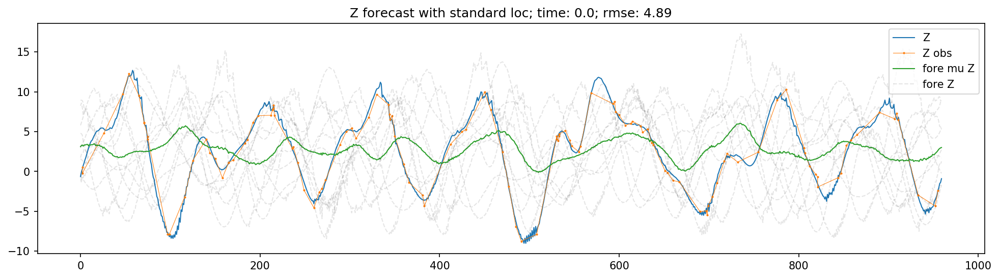

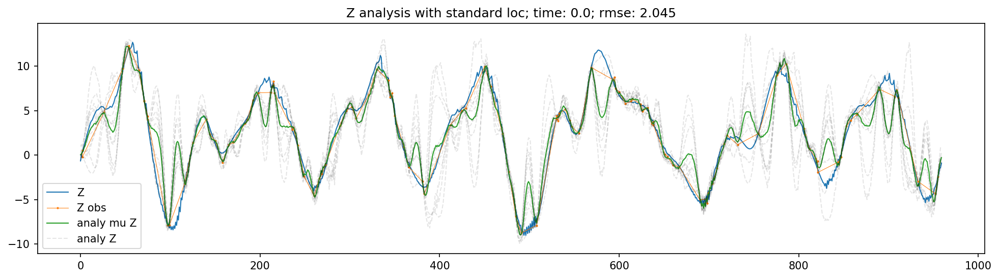

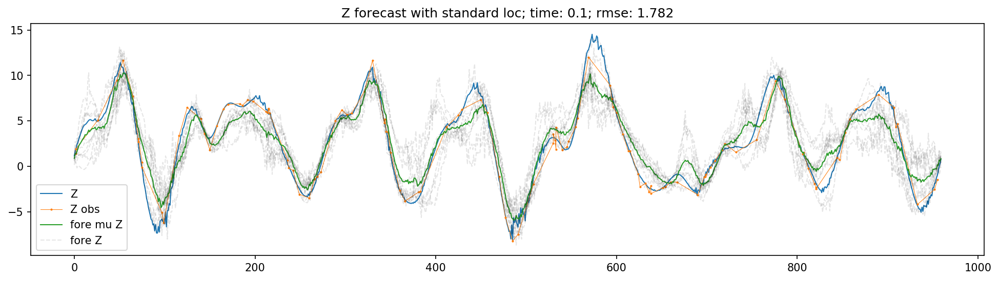

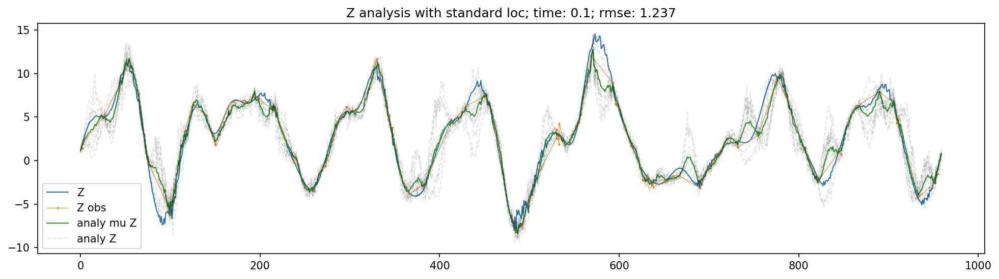

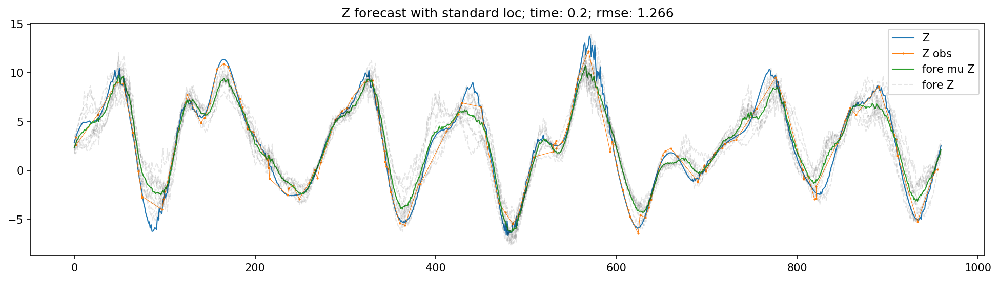

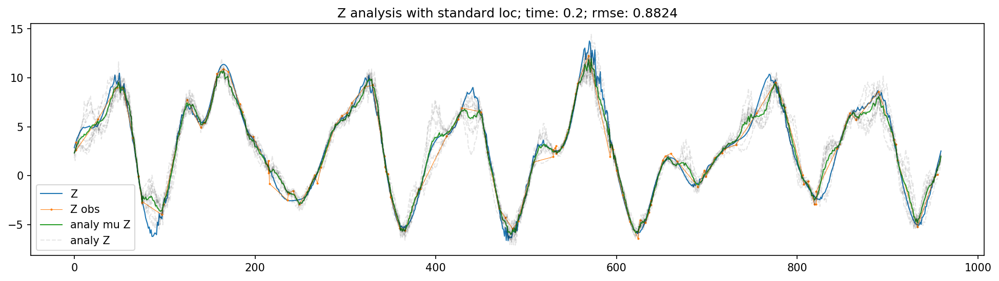

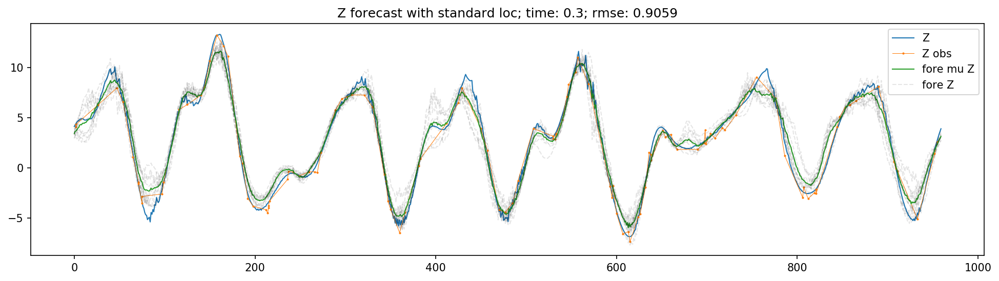

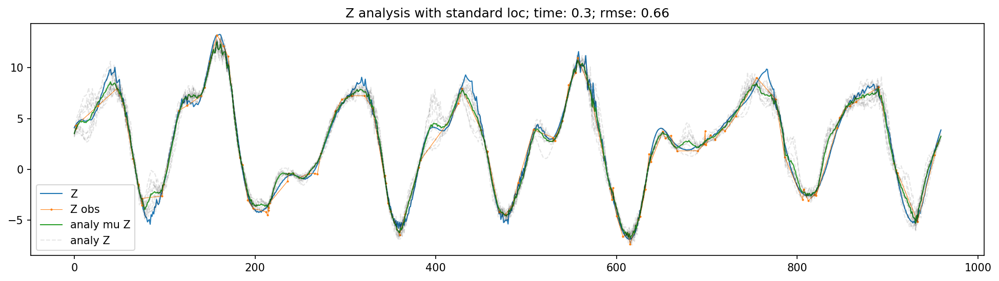

In [85]:
# times_to_see = 2 * np.arange(5, dtype=float)
times_to_see = t_obs[:4]
for this_time in times_to_see:
    
    this_ens = Zf_ens_ts.sel(time=this_time)
    
    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'fore mu Z', 'fore Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z forecast with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')


    this_ens = Za_ens_ts.sel(time=this_time)

    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'analy mu Z', 'analy Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z analysis with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')

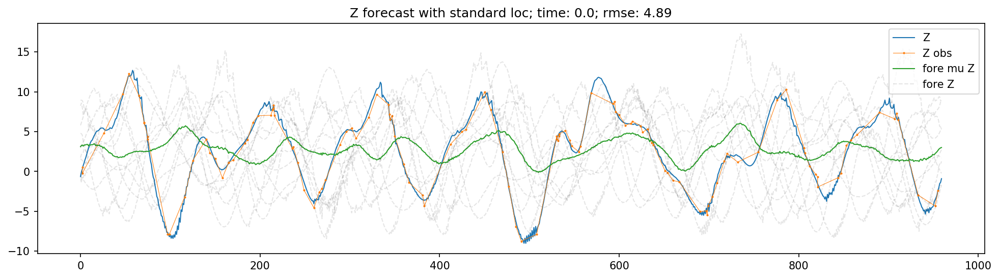

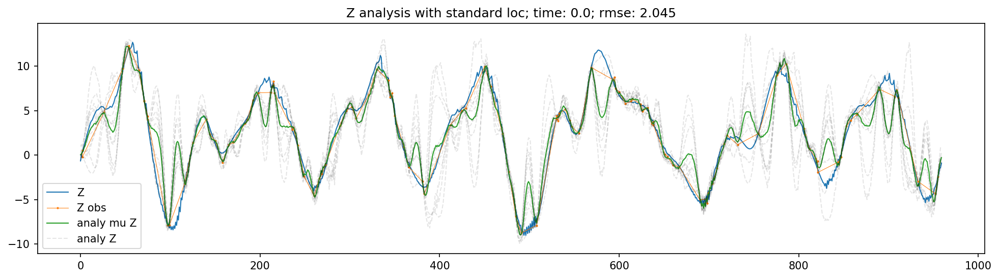

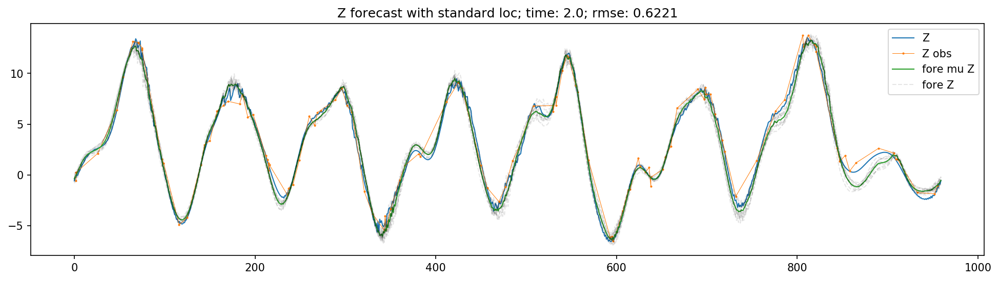

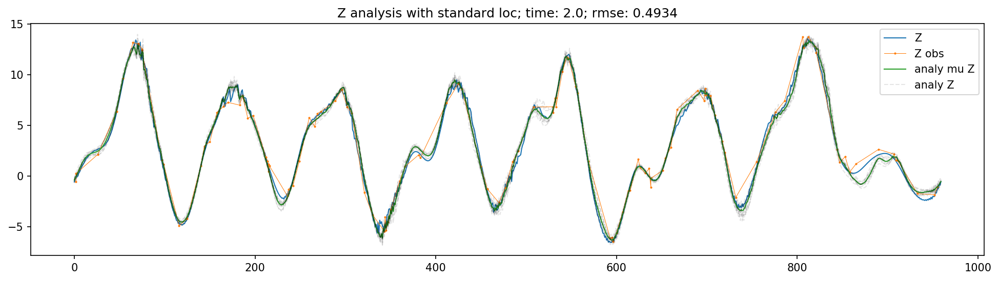

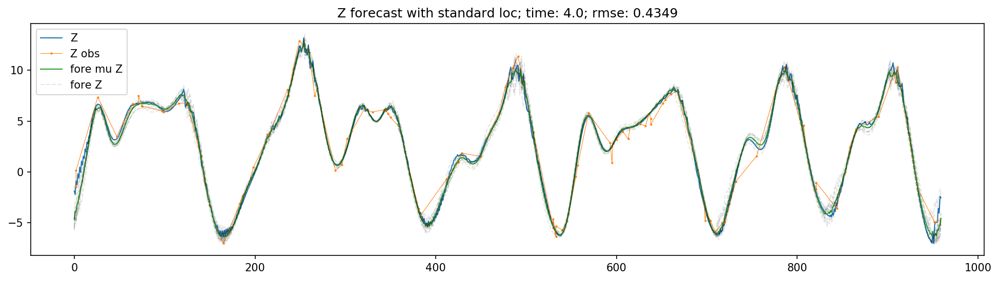

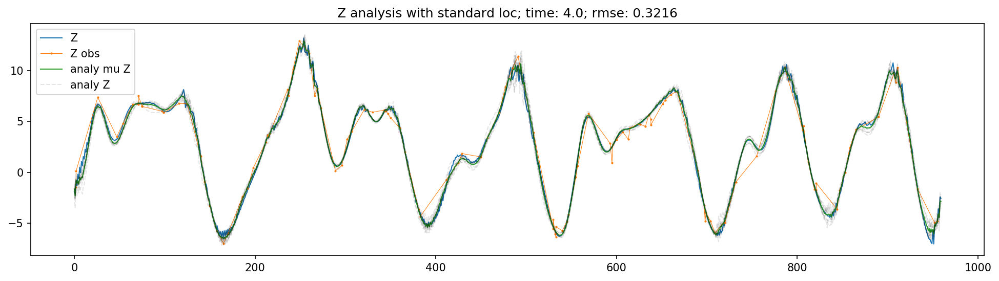

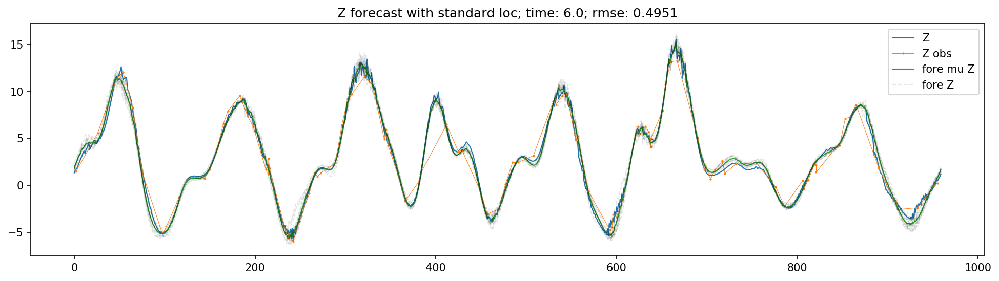

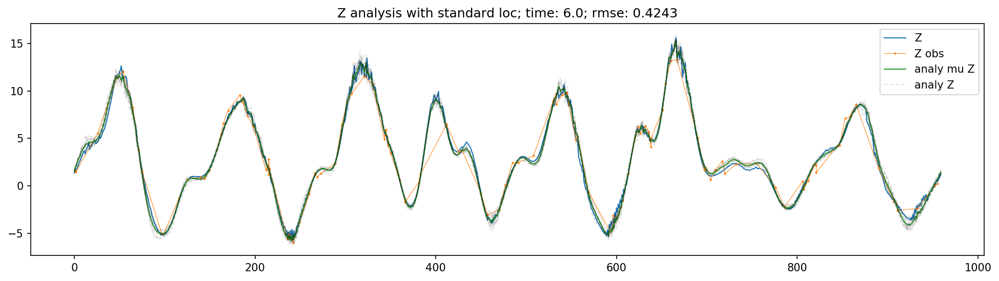

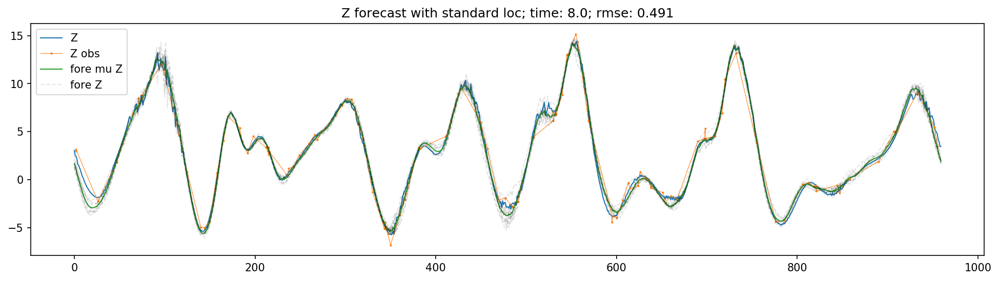

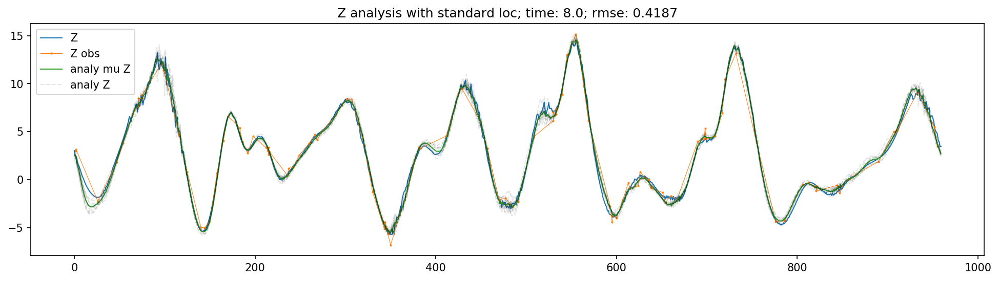

In [86]:
times_to_see = 2 * np.arange(5, dtype=float)
for this_time in times_to_see:
    
    this_ens = Zf_ens_ts.sel(time=this_time)
    
    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'fore mu Z', 'fore Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z forecast with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')


    this_ens = Za_ens_ts.sel(time=this_time)

    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'analy mu Z', 'analy Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z analysis with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')

In [87]:
rmse_Z_st1 = np.sqrt(((Zf_ens_ts.mean(dim='ens_num') - Z_ts)**2).mean(dim='loc'))
sd_Z_st1 = np.sqrt((Zf_ens_ts.var(dim='ens_num').mean(dim='loc')))

Text(0.5, 1.0, 'RMSE & std. with standard Localization')

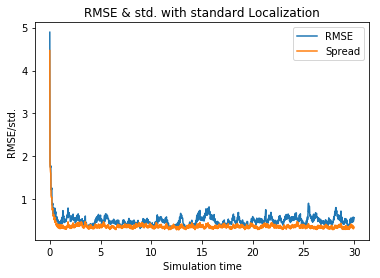

In [88]:
# loc is 5
plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

In [89]:
rmse_Z_st1[:int(5/dt)].mean().item()

0.5707649513024605

Text(0.5, 1.0, 'RMSE & std. with standard Localization')

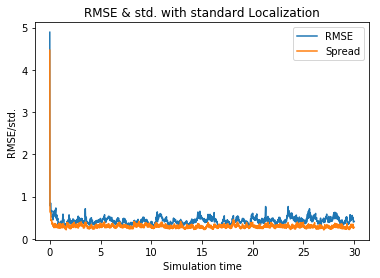

In [78]:
# loc is 15
plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

In [79]:
rmse_Z_st1[:int(5/dt)].mean().item()

0.4436360758669032

Text(0.5, 1.0, 'RMSE & std. with standard Localization')

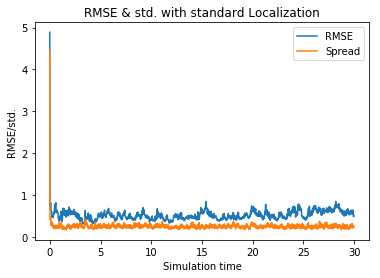

In [59]:
# loc is 50
plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

In [60]:
rmse_Z_st1[:int(5/dt)].mean().item()

0.5098481536283286

Text(0.5, 1.0, 'RMSE & std. with standard Localization')

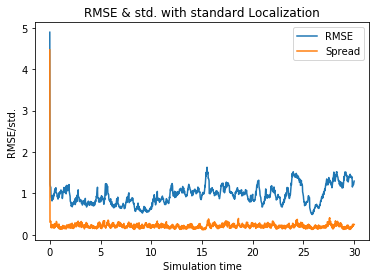

In [50]:
# loc is 150
plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

In [51]:
rmse_Z_st1[:int(5/dt)].mean().item()

0.8963653034713241

Text(0.5, 1.0, 'RMSE & std. with standard Localization')

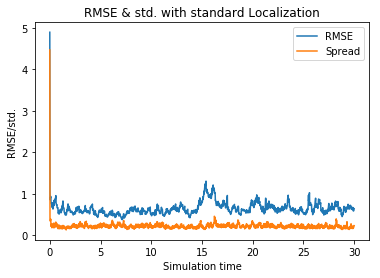

In [38]:
#loc is 100

plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

In [42]:
rmse_Z_st1[:int(5/dt)].mean().item()

0.6220696564513428

In [40]:
rmse_Z_st1.shape

(3001,)

In [39]:
5/dt

500.0

# Cycle with SVD localization 

In [74]:
atitle='SVD loc'

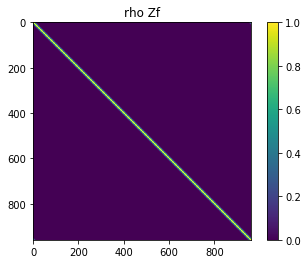

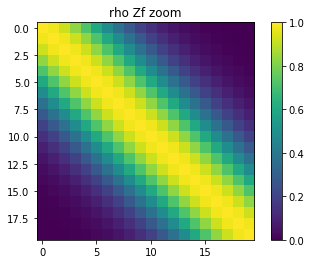

In [75]:
rho0_Zf = 5
rho_Zf = np.arange(N_Z)
rho_Zf = np.minimum(np.abs(N_Z - rho_Zf)%N_Z, rho_Zf)
rho_Zf = np.exp(-(rho_Zf**2)/(2*rho0_Zf**2))
rho_Zf = sp.linalg.circulant(rho_Zf)
imshow(rho_Zf, 'rho Zf',
       vmin=0, vmax=1)
imshow(rho_Zf[:20, :20], 'rho Zf zoom',
       vmin=0, vmax=1)

# rho0_Zc = 100
# rho_Zc = np.arange(N_Z)
# rho_Zc = np.minimum(np.abs(N_Z - rho_Zc)%N_Z, rho_Zc)
# rho_Zc = np.exp(-(rho_Zc**2)/(2*rho0_Zc**2))
# rho_Zc = sp.linalg.circulant(rho_Zc)
# rho_Zc = np.ones_like(rho_Zc)
# imshow(rho_Zc, 'rho Zc',
#        vmin=0, vmax=1)

rho0_Zc = None

cycle_dict = {'X0_ens': X0_ens, 'Z0_ens': Z0_ens,
              'X_obs_ts': X_obs_ts, 'Z_obs_ts': Z_obs_ts,
              'R_X': R_Xc, 'R_Z': R_Z,
              'H_X': H_Xc, 'H_Z': H_Z,
              'dt': dt,
              'coarse': coarse,
              'rho_Zc': rho_Zc,
              'rho_Zf': rho_Zf,
              'H_sub': H_sub, 'R_sub': R_sub,
              'assim_type': 'SVD_loc'}

In [76]:
importlib.reload(assimilate)
importlib.reload(utilities)

X_ens_ts, Z_ens_ts = assimilate.cycle_KF_LM3(**cycle_dict)

0.0
assimed
pushed Z
pushed X
0.1
assimed
pushed Z
pushed X
0.2
assimed
pushed Z
pushed X
0.3
assimed
pushed Z
pushed X
0.4
assimed
pushed Z
pushed X
0.5
assimed
pushed Z
pushed X
0.6
assimed
pushed Z
pushed X
0.7
assimed
pushed Z
pushed X
0.8
assimed
pushed Z
pushed X
0.9
assimed
pushed Z
pushed X
1.0
assimed
pushed Z
pushed X
1.1
assimed
pushed Z
pushed X
1.2
assimed
pushed Z
pushed X
1.3
assimed
pushed Z
pushed X
1.4
assimed
pushed Z
pushed X
1.5
assimed
pushed Z
pushed X
1.6
assimed
pushed Z
pushed X
1.7
assimed
pushed Z
pushed X
1.8
assimed
pushed Z
pushed X
1.9
assimed
pushed Z
pushed X
2.0
assimed
pushed Z
pushed X
2.1
assimed
pushed Z
pushed X
2.2
assimed
pushed Z
pushed X
2.3
assimed
pushed Z
pushed X
2.4
assimed
pushed Z
pushed X
2.5
assimed
pushed Z
pushed X
2.6
assimed
pushed Z
pushed X
2.7
assimed
pushed Z
pushed X
2.8
assimed
pushed Z
pushed X
2.9
assimed
pushed Z
pushed X
3.0
assimed
pushed Z
pushed X
3.1
assimed
pushed Z
pushed X
3.2
assimed
pushed Z
pushed X
3.3
assime

pushed X
26.8
assimed
pushed Z
pushed X
26.9
assimed
pushed Z
pushed X
27.0
assimed
pushed Z
pushed X
27.1
assimed
pushed Z
pushed X
27.2
assimed
pushed Z
pushed X
27.3
assimed
pushed Z
pushed X
27.4
assimed
pushed Z
pushed X
27.5
assimed
pushed Z
pushed X
27.6
assimed
pushed Z
pushed X
27.7
assimed
pushed Z
pushed X
27.8
assimed
pushed Z
pushed X
27.9
assimed
pushed Z
pushed X
28.0
assimed
pushed Z
pushed X
28.1
assimed
pushed Z
pushed X
28.2
assimed
pushed Z
pushed X
28.3
assimed
pushed Z
pushed X
28.4
assimed
pushed Z
pushed X
28.5
assimed
pushed Z
pushed X
28.6
assimed
pushed Z
pushed X
28.7
assimed
pushed Z
pushed X
28.8
assimed
pushed Z
pushed X
28.9
assimed
pushed Z
pushed X
29.0
assimed
pushed Z
pushed X
29.1
assimed
pushed Z
pushed X
29.2
assimed
pushed Z
pushed X
29.3
assimed
pushed Z
pushed X
29.4
assimed
pushed Z
pushed X
29.5
assimed
pushed Z
pushed X
29.6
assimed
pushed Z
pushed X
29.7
assimed
pushed Z
pushed X
29.8
assimed
pushed Z
pushed X
29.9
assimed
pushed Z
pushed X

In [77]:
Zf_ens_ts = [da.isel(time=slice(1, None)) for da in Z_ens_ts]
Zf_ens_ts = xr.concat(Zf_ens_ts, dim='time')
temp = xr.DataArray(
    data=Z0_ens[:, :, None],
    dims=Zf_ens_ts.dims,
    coords={'loc': Zf_ens_ts['loc'].values,
            'ens_num': Zf_ens_ts['ens_num'].values,
            'time': [0]})
Zf_ens_ts = xr.concat([temp, Zf_ens_ts], dim='time')
Zf_ens_ts['time'] = np.round(Zf_ens_ts.time.values, 3)

In [78]:
Za_ens_ts = [da.isel(time=slice(None, -1)) for da in Z_ens_ts]
Za_ens_ts = xr.concat(Za_ens_ts, dim='time')
Za_ens_ts['time'] = np.round(Za_ens_ts.time.values, 3)

In [79]:
Xf_ens_ts = [da.isel(time=slice(1, None)) for da in X_ens_ts]
Xf_ens_ts = xr.concat(Xf_ens_ts, dim='time')
temp = xr.DataArray(
    data=X0_ens[:, :, None],
    dims=Xf_ens_ts.dims,
    coords={'loc': Xf_ens_ts['loc'].values,
            'ens_num': Xf_ens_ts['ens_num'].values,
            'time': [0]})
Xf_ens_ts = xr.concat([temp, Xf_ens_ts], dim='time')
Xf_ens_ts['time'] = np.round(Xf_ens_ts.time.values, 3)

In [80]:
Xa_ens_ts = [da.isel(time=slice(None, -1)) for da in X_ens_ts]
Xa_ens_ts = xr.concat(Xa_ens_ts, dim='time')
Xa_ens_ts['time'] = np.round(Xa_ens_ts.time.values, 3)

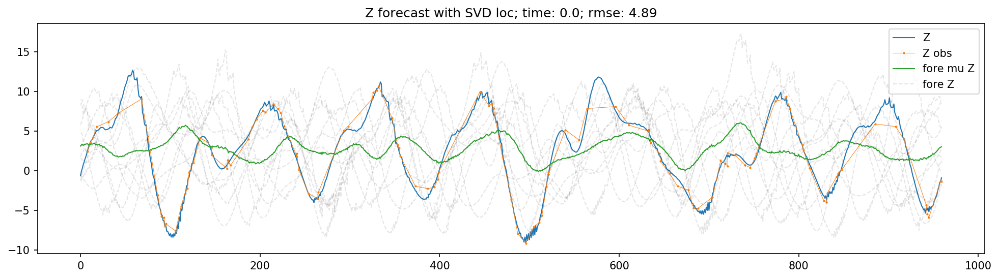

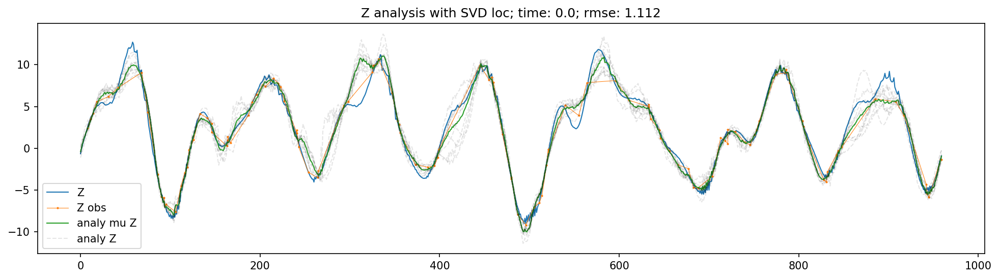

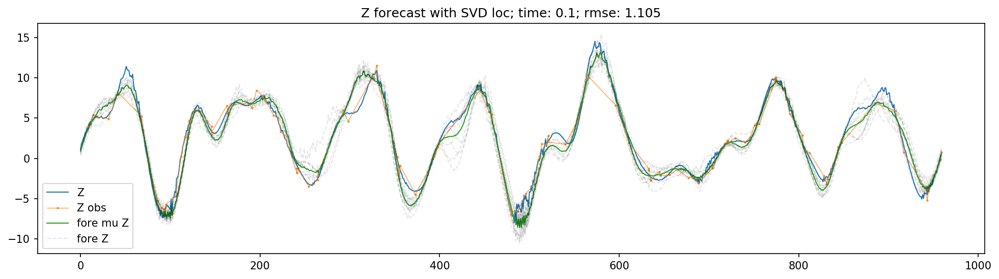

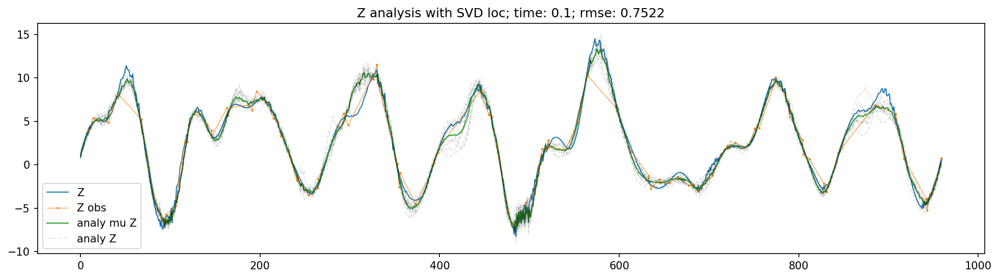

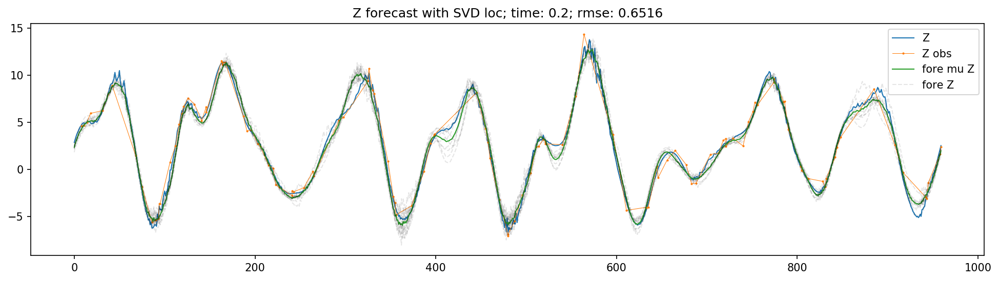

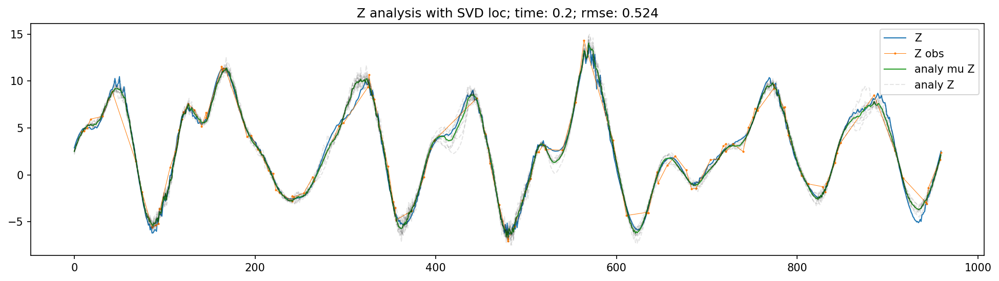

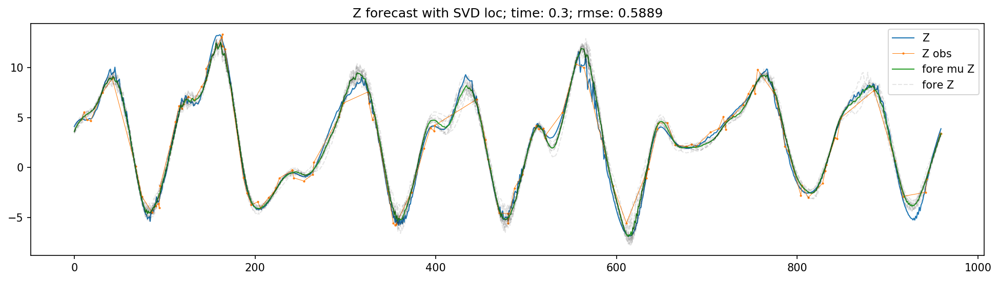

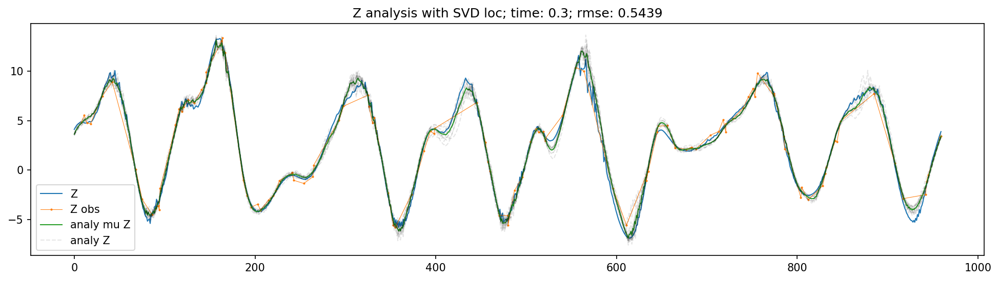

In [81]:
times_to_see = t_obs[:4]
for this_time in times_to_see:
    
    this_ens = Zf_ens_ts.sel(time=this_time)
    
    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'fore mu Z', 'fore Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z forecast with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')


    this_ens = Za_ens_ts.sel(time=this_time)

    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(Z_ts.sel(time=this_time), linewidth=1)
    plt.plot(Z_obs_loc, Z_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(this_ens, 'k--', alpha=.1, linewidth=1)
    plt.legend(['Z', 'Z obs', 'analy mu Z', 'analy Z'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - Z_ts.sel(time=this_time).values)**2).mean())
    plt.title(f'Z analysis with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')

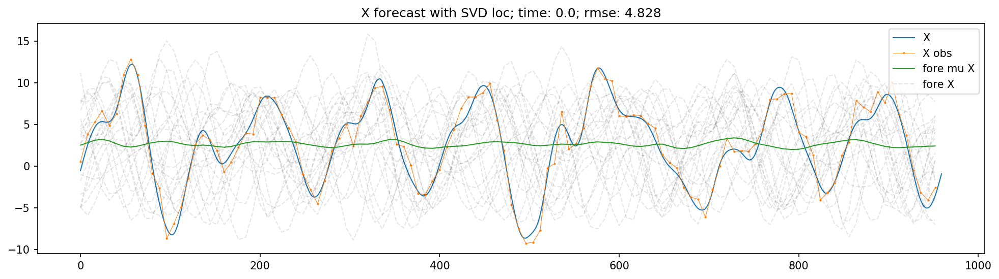

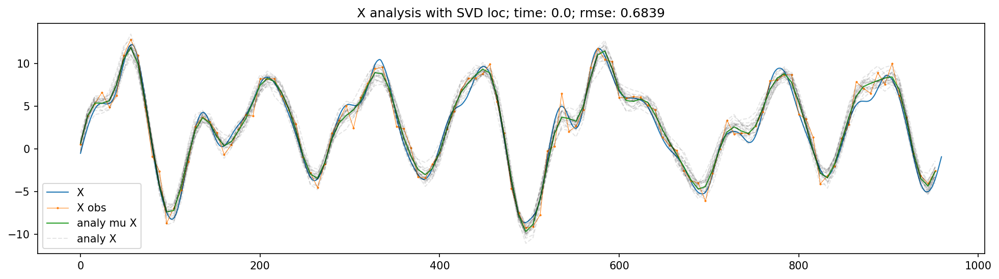

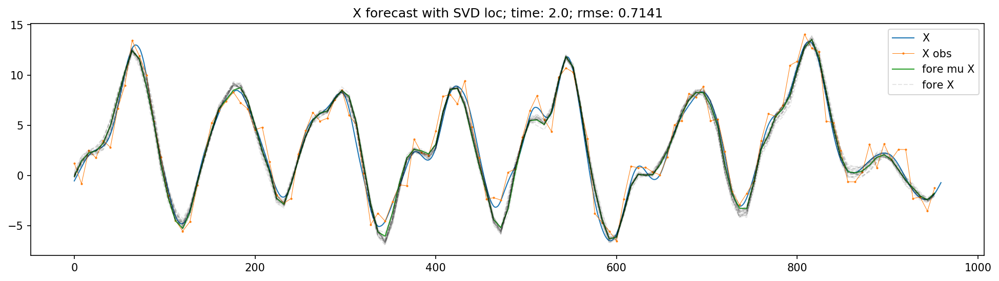

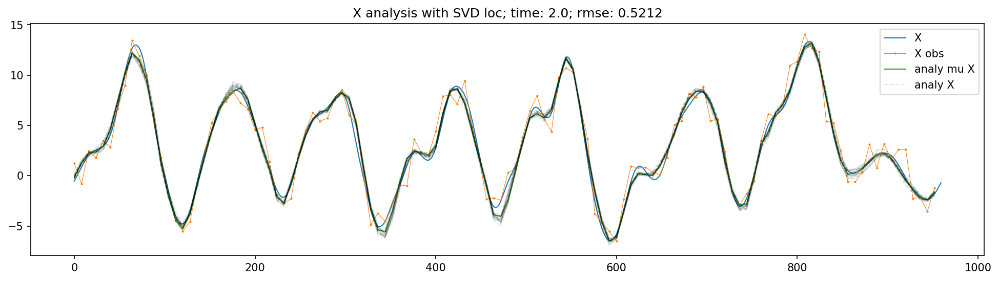

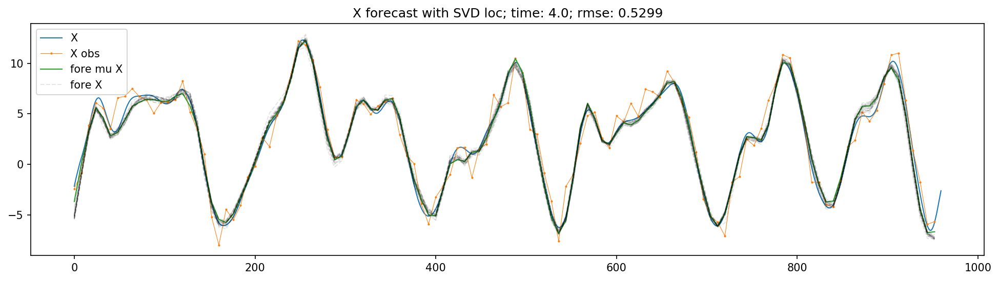

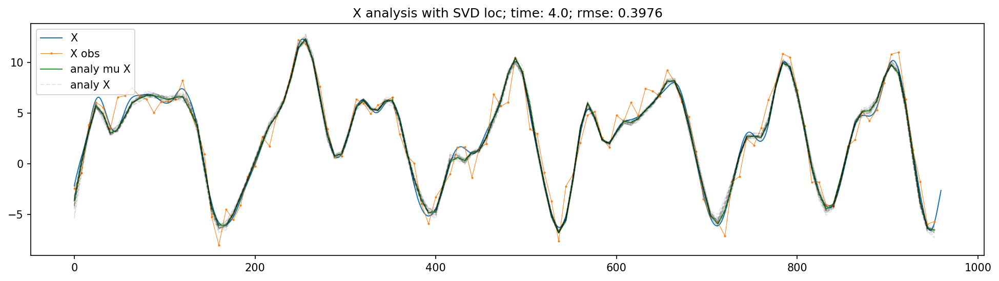

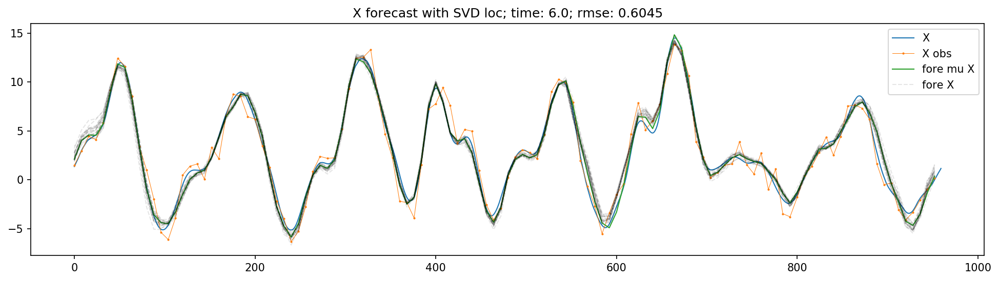

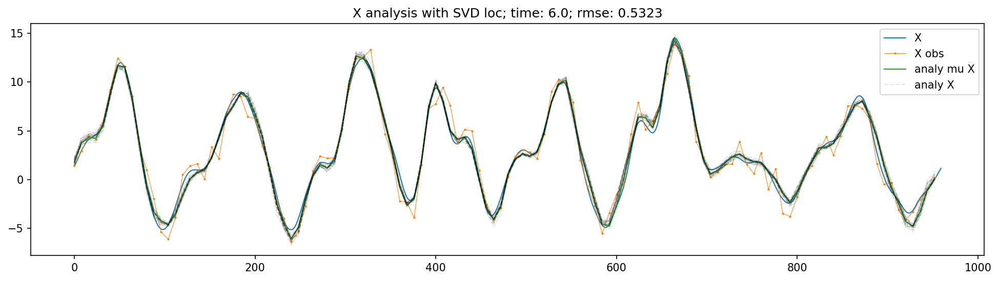

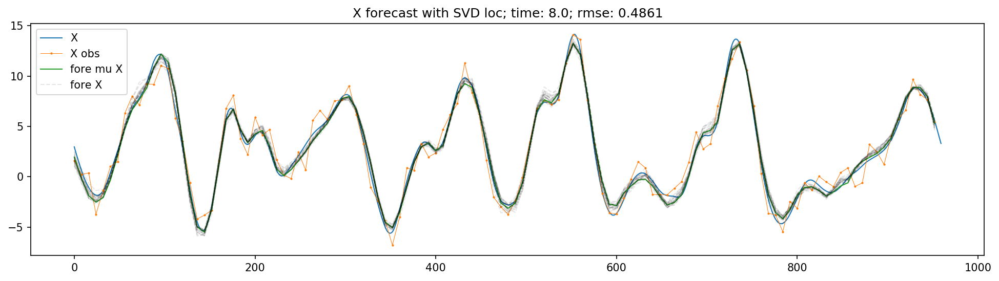

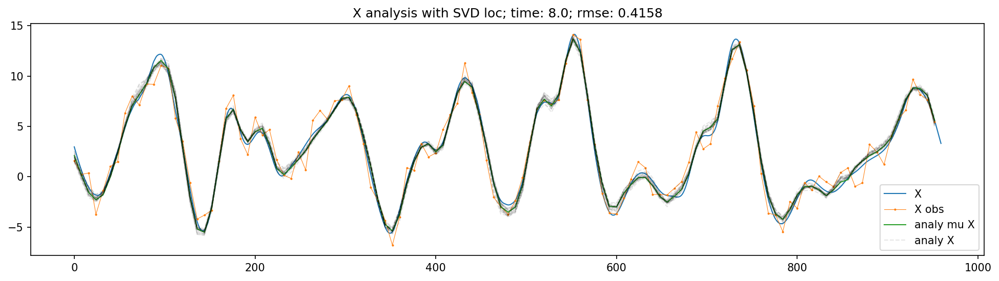

In [82]:
times_to_see = 2 * np.arange(5, dtype=float)
for this_time in times_to_see:
    
    this_ens = Xf_ens_ts.sel(time=this_time)
    
    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(X_ts.sel(time=this_time), linewidth=1)
    plt.plot(X_obs_loc, X_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(x_Xc, this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(x_Xc, this_ens.sel(ens_num=slice(0, 20)), 'k--', alpha=.1, linewidth=1)
    plt.legend(['X', 'X obs', 'fore mu X', 'fore X'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - X_ts.sel(time=this_time).values[::coarse])**2).mean())
    plt.title(f'X forecast with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')


    this_ens = Xa_ens_ts.sel(time=this_time)

    figsize = plt.figaspect(1/4)
    plt.figure(dpi=150, figsize=figsize)
    plt.plot(X_ts.sel(time=this_time), linewidth=1)
    plt.plot(X_obs_loc, X_obs_ts.sel(time=this_time), '-o', markersize=1, linewidth=0.5)
    plt.plot(x_Xc, this_ens.mean(dim='ens_num'), linewidth=1)
    plt.plot(x_Xc, this_ens.sel(ens_num=slice(0, 20)), 'k--', alpha=.1, linewidth=1)
    plt.legend(['X', 'X obs', 'analy mu X', 'analy X'])

    mu = this_ens.mean(dim='ens_num')
    rmse = np.sqrt(((mu.values - X_ts.sel(time=this_time).values[::coarse])**2).mean())
    plt.title(f'X analysis with {atitle}; time: {this_time:0.2}; rmse: {rmse:0.4}')

In [83]:
rmse_Z_svd1 = np.sqrt(((Zf_ens_ts.mean(dim='ens_num') - Z_ts)**2).mean(dim='loc'))
sd_Z_svd1 = np.sqrt((Zf_ens_ts.var(dim='ens_num').mean(dim='loc')))

rmse_X_svd1 = np.sqrt(((Xf_ens_ts.mean(dim='ens_num') - X_ts)**2).mean(dim='loc'))
sd_X_svd1 = np.sqrt((Xf_ens_ts.var(dim='ens_num').mean(dim='loc')))

# RMSE plots

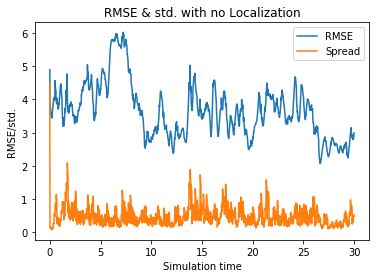

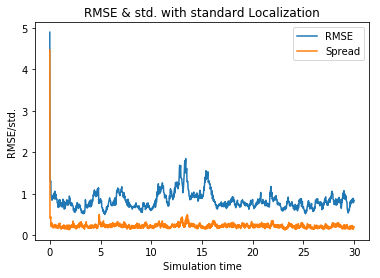

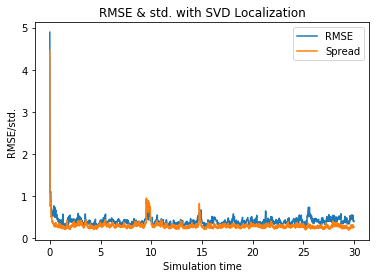

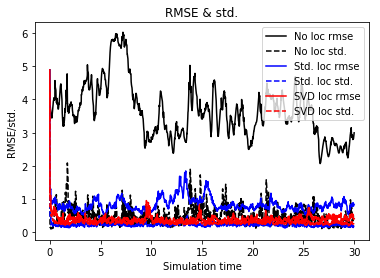

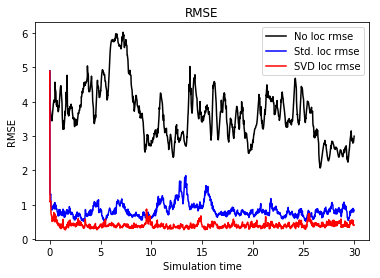

In [84]:
plt.figure()
plt.plot(t_kf, rmse_Z_nl1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_nl1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with no Localization')

plt.figure()
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with standard Localization')

plt.figure()
plt.plot(t_kf, rmse_Z_svd1.sel(time=slice(0, T_KF)))
plt.plot(t_kf, sd_Z_svd1.sel(time=slice(0, T_KF)))
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.legend(['RMSE', 'Spread'])
plt.title('RMSE & std. with SVD Localization')


plt.figure()
plt.plot(t_kf, rmse_Z_nl1.sel(time=slice(0, T_KF)), 'k')
plt.plot(t_kf, sd_Z_nl1.sel(time=slice(0, T_KF)), 'k--')
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)), 'b')
plt.plot(t_kf, sd_Z_st1.sel(time=slice(0, T_KF)), 'b--')
plt.plot(t_kf, rmse_Z_svd1.sel(time=slice(0, T_KF)), 'r')
plt.plot(t_kf, sd_Z_svd1.sel(time=slice(0, T_KF)), 'r--')
plt.xlabel('Simulation time')
plt.ylabel('RMSE/std.')
plt.title('RMSE & std.')
plt.legend(['No loc rmse', 'No loc std.',
            'Std. loc rmse', 'Std. loc std.',
            'SVD loc rmse', 'SVD loc std.'])


plt.figure()
plt.plot(t_kf, rmse_Z_nl1.sel(time=slice(0, T_KF)), 'k')
plt.plot(t_kf, rmse_Z_st1.sel(time=slice(0, T_KF)), 'b')
plt.plot(t_kf, rmse_Z_svd1.sel(time=slice(0, T_KF)), 'r')
plt.xlabel('Simulation time')
plt.ylabel('RMSE')
plt.title('RMSE')
plt.legend(['No loc rmse',
            'Std. loc rmse',
            'SVD loc rmse'])